# TASK1 COMPLETE DATA ANALYSIS REPORT

In [1]:
#from fifa eda using plotly

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [3]:
data= pd.read_csv('players_20.csv')

## Data Exploration

In [4]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [5]:
data.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,...,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [6]:
col = list(data.columns)
print(col)

['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 'loaned_from', 'joined', 'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_

In [7]:
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In [9]:
data.shape

(18278, 104)

## DATA CLEANING

In [10]:
useless_column = ['dob','sofifa_id','player_url','long_name','body_type','real_face','nation_position','loaned_from','nation_position','nation_jersey_number']

In [11]:
data = data.drop(useless_column, axis = 1)

In [12]:
data.shape

(18278, 95)

In [13]:
data['BMI'] = data['weight_kg']/(data['height_cm']/100)**2

In [14]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.913495
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,...,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23.735308
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.204082
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.615211
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.163265


## Data_cleaning

In [15]:
data[['short_name','player_positions']]

,short_name,player_positions
0,L. Messi,"RW, CF, ST"
1,Cristiano Ronaldo,"ST, LW"
2,Neymar Jr,"LW, CAM"
3,J. Oblak,GK
4,E. Hazard,"LW, CF"
...,...,...
18273,Shao Shuai,CB
18274,Xiao Mingjie,CB
18275,Zhang Wei,CM
18276,Wang Haijian,CM


In [16]:
new_player_position = data['player_positions'].str.get_dummies(sep = ',').add_prefix('Position')
new_player_position.head()

,Position CAM,Position CB,Position CDM,Position CF,Position CM,Position LB,Position LM,Position LW,Position LWB,Position RB,...,PositionGK,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [17]:
data =pd.concat([data,new_player_position],axis = 1)

In [18]:
data = data.drop('player_positions', axis = 1)

In [19]:
columns = ['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm','cdm','rdm','rwb','lb','lcb','cb','rcb','rb']

In [20]:
data[columns].head()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [21]:
for col in columns:
    data[col] = data[col].str.split('+',n=1,expand = True)[0]
data[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,...,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,...,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,...,66,61,61,61,66,61,46,46,46,61
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83,83,83,89,88,88,88,89,89,89,...,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32,32,32,31,31,31,31,31,31,31,...,43,42,42,42,43,45,46,46,46,45
18274,33,33,33,33,32,32,32,33,33,33,...,44,43,43,43,44,46,47,47,47,46
18275,43,43,43,43,43,43,43,43,44,44,...,47,49,49,49,47,47,49,49,49,47
18276,43,43,43,45,44,44,44,45,46,46,...,48,48,48,48,48,48,49,49,49,48


In [22]:
data[columns] = data[columns].fillna(0)

In [23]:
data[columns] = data[columns].astype(int)

In [24]:
columns = ['dribbling','defending','passing','shooting','pace','physic']

In [25]:
data[columns]

,dribbling,defending,passing,shooting,pace,physic
0,96.0,39.0,92.0,92.0,87.0,66.0
1,89.0,35.0,82.0,93.0,90.0,78.0
2,95.0,32.0,87.0,85.0,91.0,58.0
3,NaN,NaN,NaN,NaN,NaN,NaN
4,94.0,35.0,86.0,83.0,91.0,66.0
...,...,...,...,...,...,...
18273,33.0,47.0,28.0,23.0,57.0,51.0
18274,35.0,48.0,33.0,24.0,58.0,48.0
18275,45.0,48.0,44.0,35.0,54.0,51.0
18276,47.0,45.0,47.0,35.0,59.0,52.0


In [26]:
data[columns].isnull().sum()

dribbling    2036
defending    2036
passing      2036
shooting     2036
pace         2036
physic       2036
dtype: int64

In [27]:
data[columns].isnull().sum()

dribbling    2036
defending    2036
passing      2036
shooting     2036
pace         2036
physic       2036
dtype: int64

In [28]:
data[columns]

,dribbling,defending,passing,shooting,pace,physic
0,96.0,39.0,92.0,92.0,87.0,66.0
1,89.0,35.0,82.0,93.0,90.0,78.0
2,95.0,32.0,87.0,85.0,91.0,58.0
3,NaN,NaN,NaN,NaN,NaN,NaN
4,94.0,35.0,86.0,83.0,91.0,66.0
...,...,...,...,...,...,...
18273,33.0,47.0,28.0,23.0,57.0,51.0
18274,35.0,48.0,33.0,24.0,58.0,48.0
18275,45.0,48.0,44.0,35.0,54.0,51.0
18276,47.0,45.0,47.0,35.0,59.0,52.0


In [29]:
data[columns] = data[columns].fillna(0)

In [30]:
data.isnull().sum()

short_name     0
age            0
height_cm      0
weight_kg      0
nationality    0
              ..
PositionRB     0
PositionRM     0
PositionRW     0
PositionRWB    0
PositionST     0
Length: 124, dtype: int64

In [31]:
!pip install plotly

In [32]:
import plotly
import plotly.graph_objects as go
import plotly.express as px

In [33]:
fig = go.Figure(data=go.Scatter(x = data['overall'],y= data['value_eur'],mode = 'markers',marker=dict(size = 10,color = data['age'],showscale = True),text= data['short_name']))
fig.update_layout(title = 'scatterplot for overall Rating vs value in euros', xaxis_title = 'overall_rating',yaxis_title = 'value_eur')

In [34]:
fig=go.Figure( data= go.Scatter(x= data['overall'],y = data['BMI'],mode = 'markers',marker = dict(size = 10,color = data['age'],showscale=True),text = data['short_name']))
fig.update_layout(title = 'scatterplot for overall rating vs bmi of player', xaxis_title ='overall_rating', yaxis_title =' BMI of player')
fig.show()

In [35]:
fig=go.Figure( data= go.Scatter(x= data['overall'],y = data['age'],mode = 'markers',marker = dict(size = 10,color = data['age'],showscale=True),text = data['short_name']))
fig.update_layout(title = 'scatterplot for overall rating vs age of player', xaxis_title ='overall_rating', yaxis_title =' age')
fig.show()

## EDA

In [36]:
#Taking subsets of data for analysis
dataset1 = data[['short_name', 'age','height_cm' ,'weight_kg','nationality','club', 'overall','potential','value_eur','wage_eur','international_reputation'
                 ,'weak_foot','skill_moves','release_clause_eur']]

In [37]:
numeric_features = ['age','height_cm','weight_kg', 'overall','potential', 'value_eur','wage_eur','international_reputation','weak_foot','skill_moves','release_clause_eur']

In [38]:
numeric_dataset1 = data[numeric_features]

In [39]:
dataset1.describe()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04
mean,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06
std,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07
min,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04
25%,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05
50%,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,2.000000,1.200000e+06
75%,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,3.000000,3.700000e+06
max,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,5.000000,1.958000e+08


In [40]:
dataset1.isnull().sum()

short_name                     0
age                            0
height_cm                      0
weight_kg                      0
nationality                    0
club                           0
overall                        0
potential                      0
value_eur                      0
wage_eur                       0
international_reputation       0
weak_foot                      0
skill_moves                    0
release_clause_eur          1298
dtype: int64

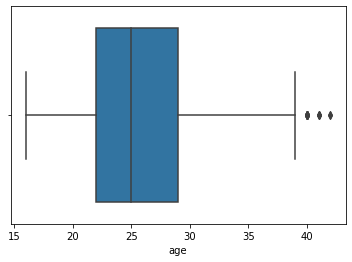

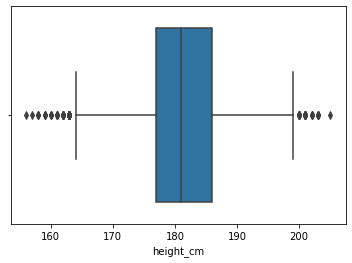

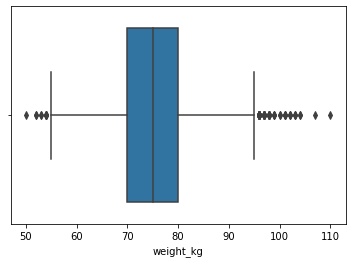

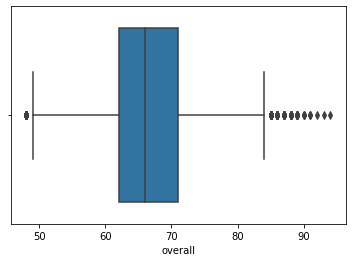

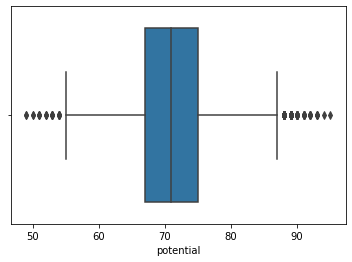

...

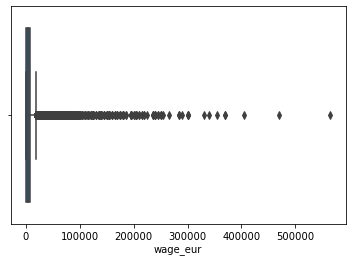

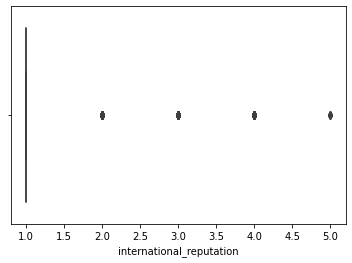

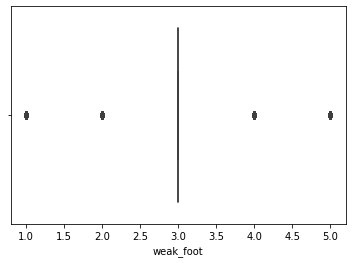

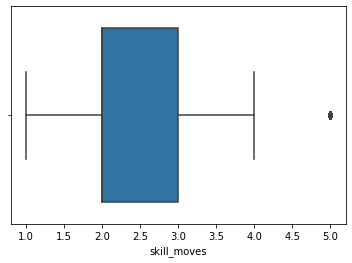

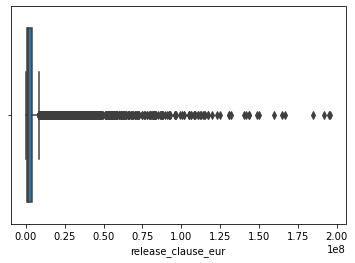

In [41]:
#Boxplot for outliers
for col in numeric_dataset1.columns:
    sns.boxplot(x = col,data = dataset1)
    plt.show()

array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'height_cm'}>,
        <AxesSubplot:title={'center':'weight_kg'}>],
       [<AxesSubplot:title={'center':'overall'}>,
        <AxesSubplot:title={'center':'potential'}>,
        <AxesSubplot:title={'center':'value_eur'}>],
       [<AxesSubplot:title={'center':'wage_eur'}>,
        <AxesSubplot:title={'center':'international_reputation'}>,
        <AxesSubplot:title={'center':'weak_foot'}>],
       [<AxesSubplot:title={'center':'skill_moves'}>,
        <AxesSubplot:title={'center':'release_clause_eur'}>,
        <AxesSubplot:>]], dtype=object)

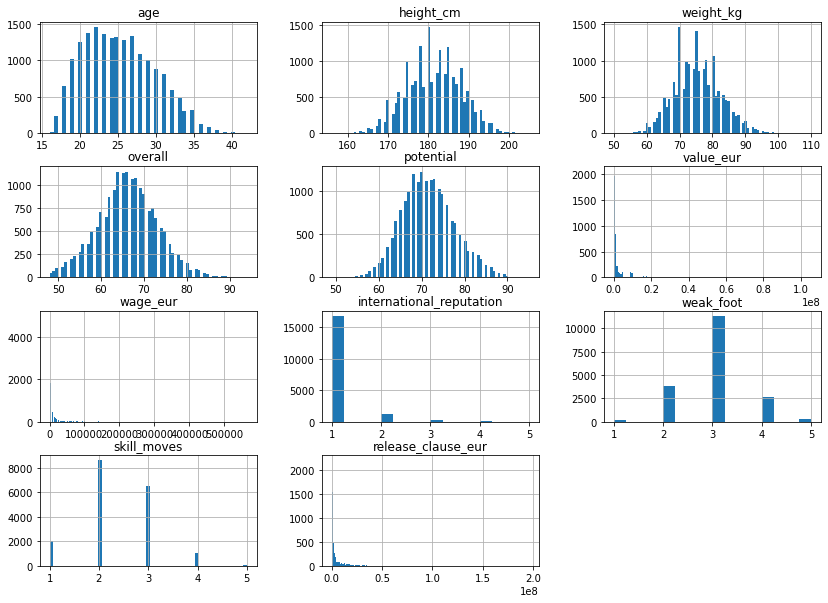

In [42]:
dataset1.hist(bins = 'auto', figsize = (14,10))

# Exploring features

# AGE

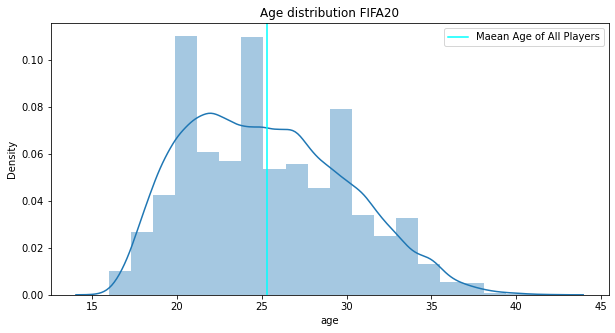

In [43]:
plt.figure(figsize = (10,5))
plt.title('Age distribution FIFA20')
sns.distplot(a = dataset1['age'],kde  =True , bins = 20)
plt.axvline(x = np.mean(dataset1['age']),c = 'cyan', label = 'Maean Age of All Players')
plt.legend()

###  Counts of age

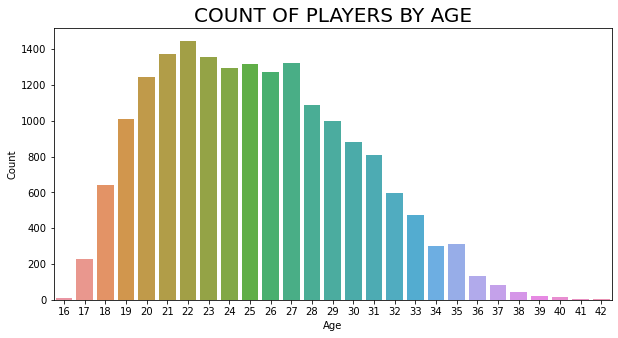

In [44]:
plt.figure(figsize = (10,5))
ax = sns.countplot(x = 'age',data = dataset1)
ax.set_title(label = 'COUNT OF PLAYERS BY AGE', fontsize = 20)
ax.set_xlabel(xlabel = 'Age')
ax.set_ylabel(ylabel= 'Count')
plt.show()

#### OLDEST PLAYERS 

In [45]:

data.loc[dataset1['age']==data['age'].max()]

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionGK,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST
11832,C. Muñoz,42,177,73,Argentina,CD Universidad de Concepción,64,64,50000,1000,...,1,0,0,0,0,0,0,0,0,0
13003,H. Sulaimani,42,173,70,Saudi Arabia,Al Ahli,63,63,0,5000,...,0,1,0,0,0,0,0,0,0,0


#### YOUNGEST PLAYERS

In [46]:

data.loc[data['age']==dataset1['age'].min()]

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionGK,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST
4764,A. Hložek,16,185,80,Czech Republic,Sparta Praha,70,86,3500000,1000,...,0,0,0,0,0,0,0,1,0,0
6630,Fábio Silva,16,185,75,Portugal,FC Porto,68,85,1800000,1000,...,0,0,0,0,0,0,0,0,0,1
12158,E. Millot,16,175,65,France,AS Monaco,63,86,800000,1000,...,0,0,0,0,0,0,0,0,0,0
12160,S. Esposito,16,186,75,Italy,Inter,63,85,825000,2000,...,0,0,0,0,0,0,0,0,0,1
14626,A. Velasco,16,167,63,Argentina,Independiente,60,83,450000,1000,...,0,0,1,0,0,0,0,0,0,0
17614,D. Obbekjær,16,193,86,Denmark,Odense Boldklub,53,71,110000,1000,...,0,0,0,0,0,0,0,0,0,0
17782,S. Anderson,16,175,64,United States,Colorado Rapids,52,75,100000,1000,...,0,0,0,0,0,1,0,0,0,0
17827,D. Burns,16,176,62,Northern Ireland,St. Patrick's Athletic,52,69,100000,1000,...,0,0,0,0,0,0,1,0,0,0
18031,O. Stefánsson,16,190,75,Iceland,IFK Norrköping,51,64,60000,1000,...,0,0,0,0,0,0,0,0,0,0
18171,J. Starbuck,16,174,69,England,Grimsby Town,49,72,60000,1000,...,0,0,0,0,0,0,0,0,0,0


In [47]:
dataset1['age'].skew()

0.38061976075931975

### Impact of age on overall rating

In [48]:
fig = go.Figure()
fig = go.Figure(data = go.Scatter(
    x = dataset1['age'],
    y = dataset1['overall'],
    mode = 'markers',
 marker = dict(color = dataset1['overall'],showscale = True),
 text = dataset1['short_name'],))
fig.update_layout(title = 'Age vs overall Rating',
                 xaxis_title= 'Age',
                 yaxis_title = 'Overall_rating')
fig.show()


## Height

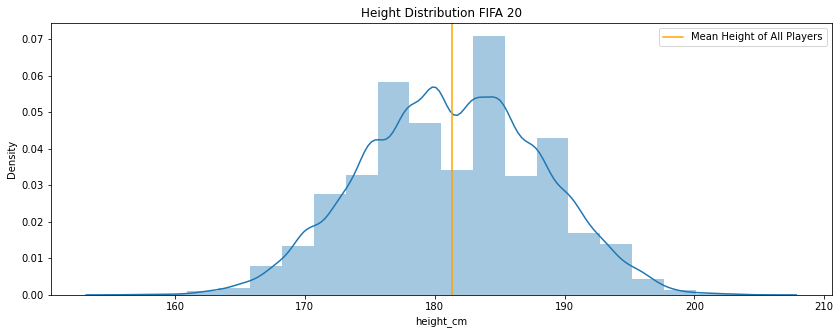

In [49]:
plt.figure(figsize=(14,5))
plt.title('Height Distribution FIFA 20')
sns.distplot(a=dataset1['height_cm'], kde=True, bins=20)
plt.axvline(x=np.mean(dataset1['height_cm']),c='orange',label='Mean Height of All Players')
plt.legend()

In [50]:
print("Tallest Players: ")
data.loc[data['height_cm'] == dataset1['height_cm'].max()]

Tallest Players: 


,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionGK,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST
9208,T. Holý,27,205,102,Czech Republic,Ipswich Town,66,70,575000,3000,...,1,0,0,0,0,0,0,0,0,0


In [51]:
print("Shortest Player: ")
data.loc[data['height_cm'] == dataset1['height_cm'].min()]

Shortest Player: 


,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionGK,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST
4829,N. Barrios,21,156,58,Argentina,San Lorenzo de Almagro,70,80,2900000,8000,...,0,0,1,0,0,0,0,0,0,0


In [52]:
dataset1['height_cm'].skew()

-0.03819688576323108

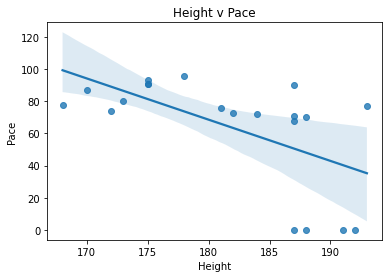

In [53]:
plt.figure()
x=data.head(20)['height_cm']
y=data.head(20)['pace']

sns.regplot(x,y)
plt.title('Height v Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

## WEIGHT

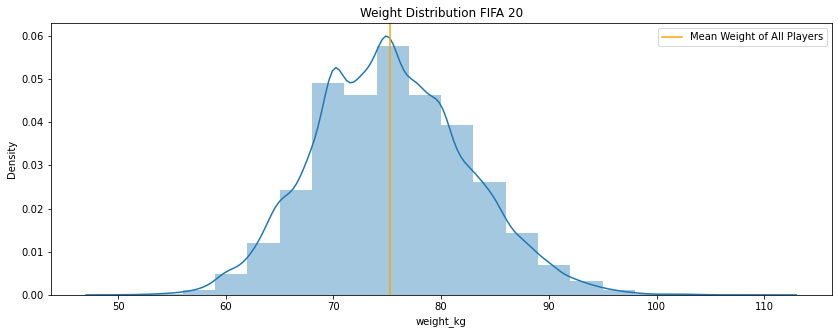

In [54]:
plt.figure(figsize=(14,5))
plt.title('Weight Distribution FIFA 20')
sns.distplot(a=dataset1['weight_kg'], kde=True, bins=20)
plt.axvline(x=np.mean(dataset1['weight_kg']),c='orange',label='Mean Weight of All Players')
plt.legend()

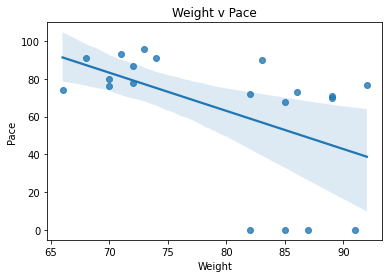

In [55]:
plt.figure()
x=data.head(20)['weight_kg']
y=data.head(20)['pace']

sns.regplot(x,y)
plt.title('Weight v Pace')
plt.xlabel('Weight')
plt.ylabel('Pace')
plt.show()

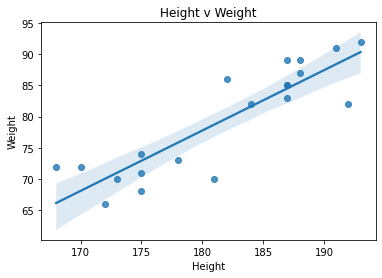

In [56]:
plt.figure()
x=data.head(20)['height_cm']
y=data.head(20)['weight_kg']

sns.regplot(x,y)
plt.title('Height v Weight')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show()

## BMI

In [57]:
data['bmi'] = data['weight_kg'] // (data['height_cm']/100)**2

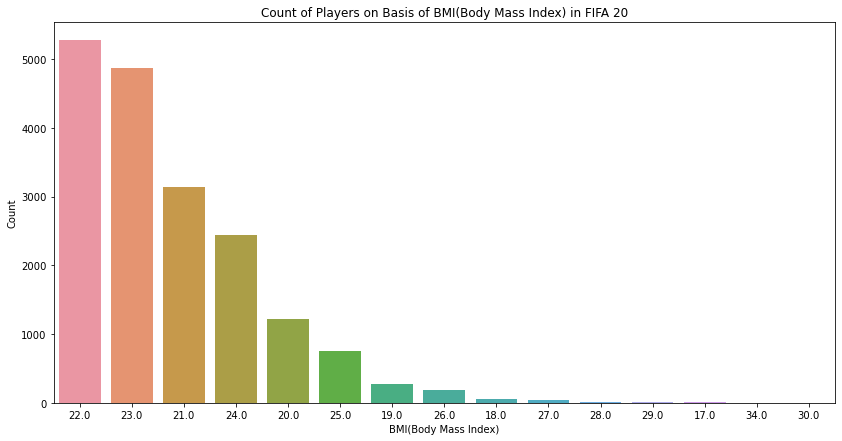

In [58]:
plt.figure(figsize= (14, 7))

ax = sns.countplot(x='bmi', data=data, order=data.bmi.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of BMI(Body Mass Index) in FIFA 20')

ax.set_xlabel(xlabel='BMI(Body Mass Index)')
ax.set_ylabel(ylabel='Count')

plt.show()

In [59]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = data['bmi'],
    y = dataset1['overall'],
    mode='markers',
    marker=dict(
        color=dataset1['overall'], 
        showscale=True
    ),
    text= dataset1['short_name'],
))

fig.update_layout(title='BMI vs Overall Rating',
                  xaxis_title='BMI',
                  yaxis_title='Overall Rating')
fig.show()

## NATIONALITY

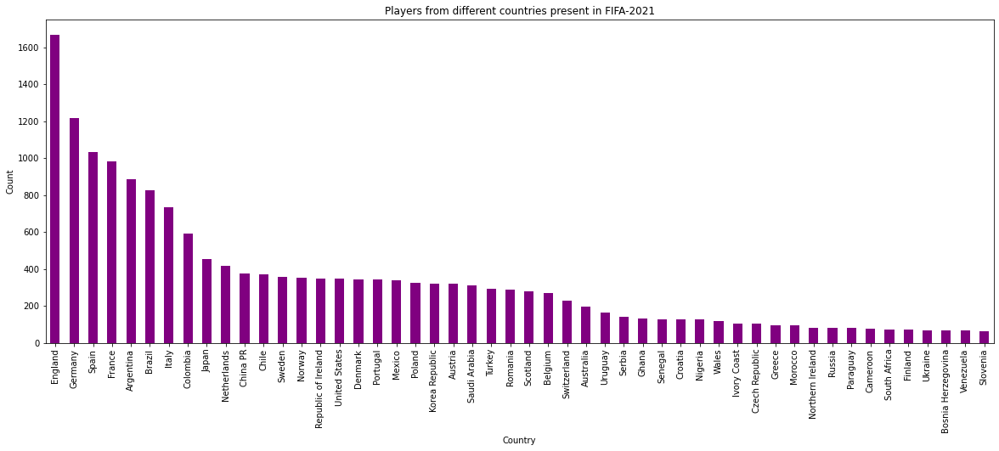

In [60]:
plt.figure(figsize = (20,7))
dataset1['nationality'].value_counts().head(50).plot.bar(color = 'purple')
plt.title('Players from different countries present in FIFA-2021')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

In [61]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = dataset1['nationality'],
    y = dataset1['overall'],
    mode='markers',
    marker=dict(
        color=dataset1['overall'], 
        showscale=True
    ),
    text= dataset1['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating')
fig.show()

## OVERALL RATING

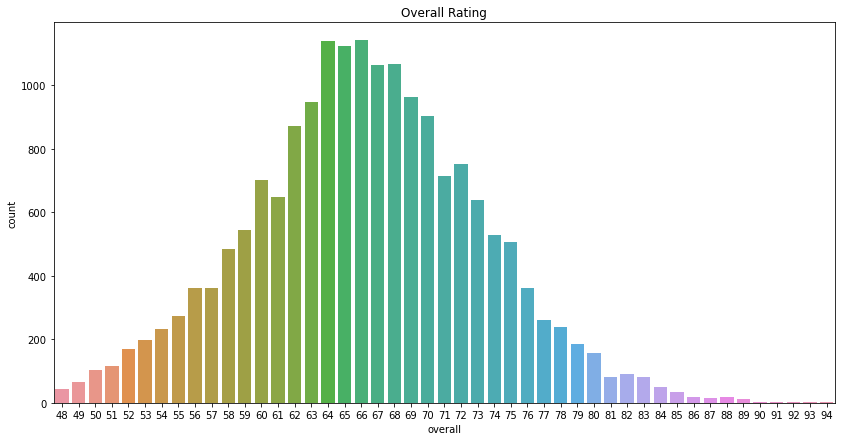

In [62]:
plt.figure(figsize=(14, 7))
sns.countplot(dataset1['overall'])
plt.title("Overall Rating")
plt.show()

In [63]:
print("Min: ", dataset1['overall'].min())
print("Mean: ", dataset1['overall'].mean())
print("Max: ", dataset1['overall'].max())

Min:  48
Mean:  66.24499398183609
Max:  94


In [64]:
#Player with highest rating
data.loc[data['overall'] == dataset1['overall'].max()]

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST,bmi
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,0,0,0,0,0,0,1,0,0,24.0


####  TOP RATED PLAYERS

In [65]:
top_rated = data.sort_values(by=["overall"], ascending=False)
top_rated.head(10)

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST,bmi
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,0,0,0,0,0,0,1,0,0,24.0
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,...,0,0,0,0,0,0,0,0,1,23.0
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,...,0,0,1,0,0,0,0,0,0,22.0
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,...,0,0,0,0,0,0,0,0,0,24.0
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,...,0,0,1,0,0,0,0,0,0,24.0
5,K. De Bruyne,28,181,70,Belgium,Manchester City,91,91,90000000,370000,...,0,0,0,0,0,0,0,0,0,21.0
6,M. ter Stegen,27,187,85,Germany,FC Barcelona,90,93,67500000,250000,...,0,0,0,0,0,0,0,0,0,24.0
7,V. van Dijk,27,193,92,Netherlands,Liverpool,90,91,78000000,200000,...,0,0,0,0,0,0,0,0,0,24.0
8,L. Modrić,33,172,66,Croatia,Real Madrid,90,90,45000000,340000,...,0,0,0,0,0,0,0,0,0,22.0
9,M. Salah,27,175,71,Egypt,Liverpool,90,90,80500000,240000,...,0,0,0,0,0,0,1,0,0,23.0


In [66]:
fig = px.pie(top_rated.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

In [67]:
fig = px.pie(top_rated.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

## POTENTIAL

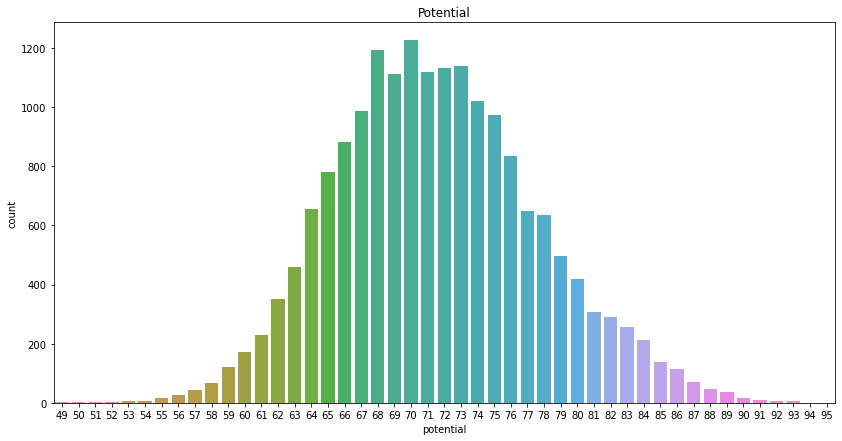

In [68]:
plt.figure(figsize=(14, 7))
sns.countplot(dataset1['potential'])
plt.title("Potential")
plt.show()

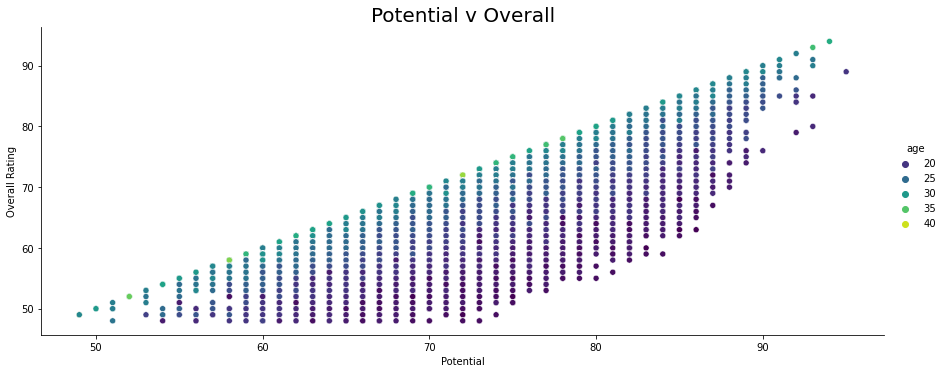

In [69]:
sns.relplot(x='potential',y='overall',hue='age',palette = 'viridis', aspect=2.5,data=data)
plt.title('Potential v Overall',fontsize = 20)
plt.xlabel('Potential')
plt.ylabel('Overall Rating')
plt.show()

## VALUE

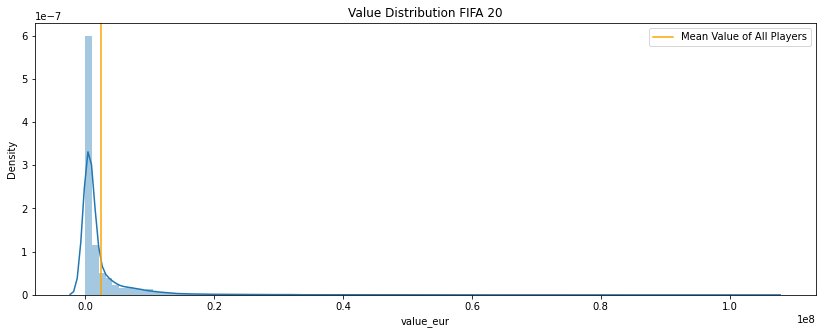

In [70]:
plt.figure(figsize=(14,5))
plt.title('Value Distribution FIFA 20')
sns.distplot(a=dataset1['value_eur'], kde=True, bins=100)
plt.axvline(x=np.mean(dataset1['value_eur']),c='orange',label='Mean Value of All Players')
plt.legend()

In [71]:
#skewness
dataset1['value_eur'].skew()

6.425940918096741

Text(0.5, 1.0, 'Value of top 10 players')

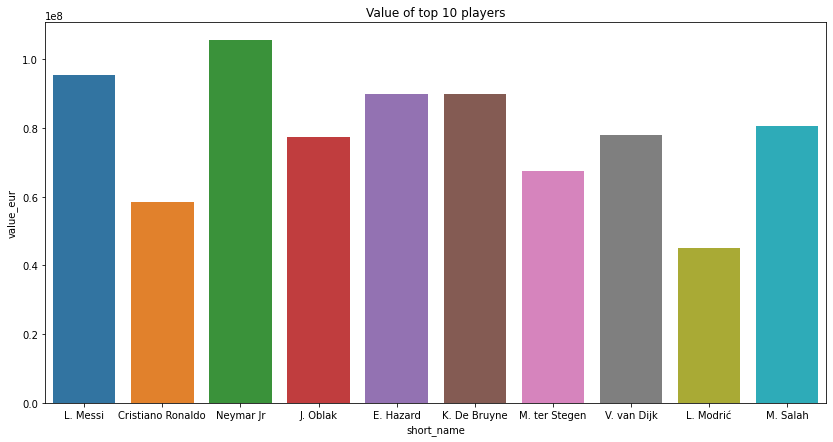

In [72]:
#Value of Top 10 players
plt.figure(figsize=(14, 7))
sns.barplot(top_rated['short_name'].head(10), top_rated['value_eur'].head(10)).set_title("Value of top 10 players")

In [73]:
#Most Valueable
data.loc[data['value_eur'] == dataset1['value_eur'].max()]

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST,bmi
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,...,0,0,1,0,0,0,0,0,0,22.0


In [74]:
#Most Valued Players
top_valued = data.sort_values(by=["value_eur"], ascending=False)
top_valued.head(10)

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST,bmi
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,...,0,0,1,0,0,0,0,0,0,22.0
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,0,0,0,0,0,0,1,0,0,24.0
10,K. Mbappé,20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,...,0,0,0,0,0,0,0,0,1,23.0
5,K. De Bruyne,28,181,70,Belgium,Manchester City,91,91,90000000,370000,...,0,0,0,0,0,0,0,0,0,21.0
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,...,0,0,1,0,0,0,0,0,0,24.0
12,H. Kane,25,188,89,England,Tottenham Hotspur,89,91,83000000,220000,...,0,0,0,0,0,0,0,0,1,25.0
9,M. Salah,27,175,71,Egypt,Liverpool,90,90,80500000,240000,...,0,0,0,0,0,0,1,0,0,23.0
7,V. van Dijk,27,193,92,Netherlands,Liverpool,90,91,78000000,200000,...,0,0,0,0,0,0,0,0,0,24.0
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,...,0,0,0,0,0,0,0,0,0,24.0
23,P. Dybala,25,177,75,Argentina,Juventus,88,92,76500000,215000,...,0,0,0,0,0,0,0,0,0,23.0


In [75]:
fig = px.pie(top_valued.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

In [76]:
fig = px.pie(top_valued.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

Text(0.5, 1.0, 'Top 10 Valued players')

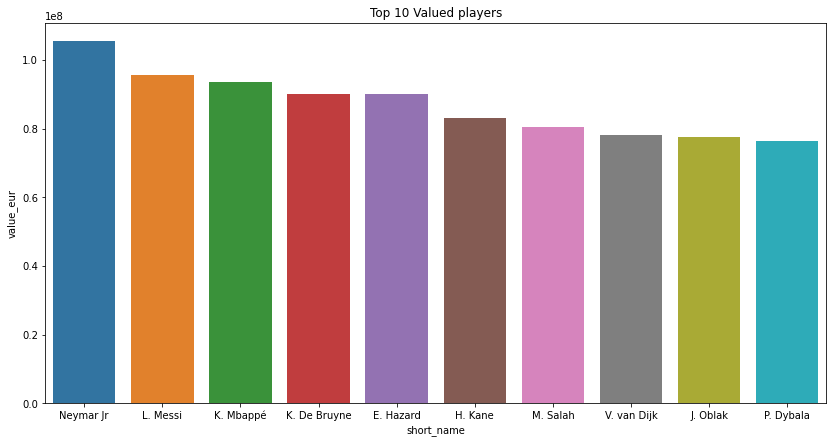

In [77]:
#Top 10 Valued players
plt.figure(figsize=(14, 7))
sns.barplot(top_valued['short_name'].head(10), top_valued['value_eur'].head(10)).set_title("Top 10 Valued players")

# Preffered foot

<AxesSubplot:xlabel='preferred_foot', ylabel='count'>

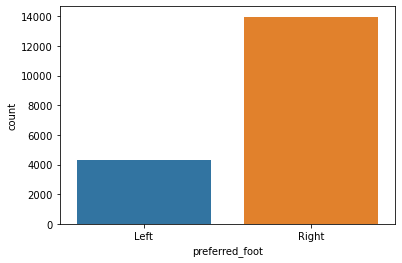

In [78]:
sns.countplot(x = data['preferred_foot'])

In [79]:
foot = ['Left', 'Right']
foot_data = data.query('preferred_foot in @foot')    
fig = px.pie(foot_data, names='preferred_foot',
             title='Preferred foot %')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [80]:
print("The average overall score of preferred Right foot", data.loc[data['preferred_foot'] == 'Right']['overall'].mean())
print("The average overall score of preferred Left foot", data.loc[data['preferred_foot'] == 'Left']['overall'].mean())

The average overall score of preferred Right foot 66.11174785100286
The average overall score of preferred Left foot 66.67577582213988


## International reputation

<AxesSubplot:xlabel='international_reputation', ylabel='count'>

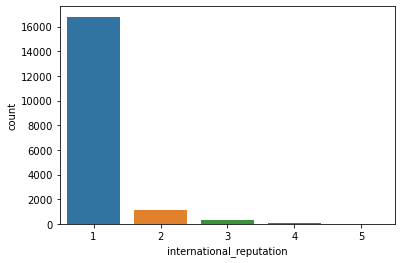

In [81]:
sns.countplot(x = dataset1['international_reputation'])

## Skill moves

<AxesSubplot:xlabel='skill_moves', ylabel='count'>

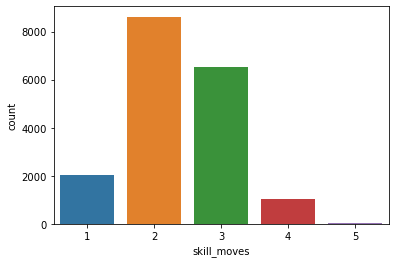

In [82]:
sns.countplot(x = dataset1['skill_moves'])

 ## Work Rate

<AxesSubplot:xlabel='work_rate', ylabel='count'>

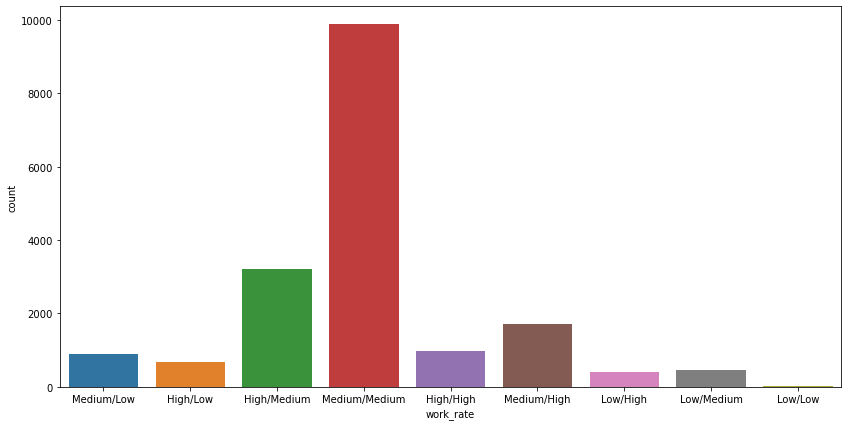

In [83]:
plt.figure(figsize=(14,7))
sns.countplot(x = data['work_rate'])

## Team Position

<AxesSubplot:xlabel='team_position', ylabel='count'>

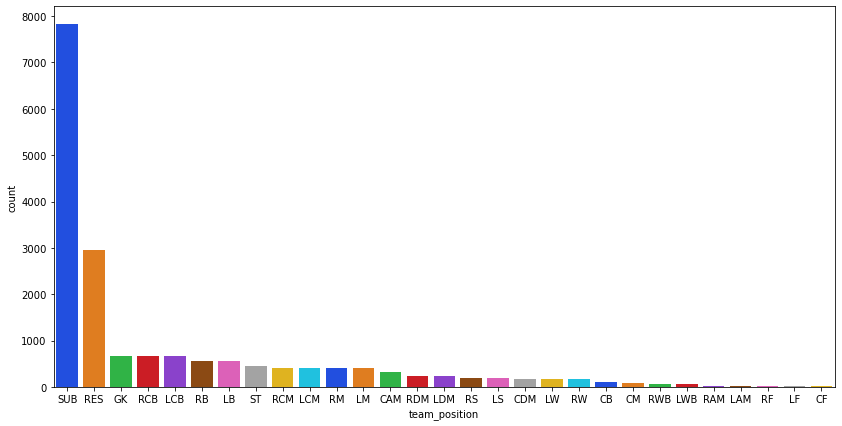

In [84]:
plt.figure(figsize=(14, 7))
sns.countplot(x='team_position', data=data, palette='bright', order=data.team_position.value_counts().index)

### Team postion grouping

In [85]:
attack = ['LW', 'RW', 'ST', 'LF', 'RF', 'CF', 'LS', 'RS']
attack_data = data.query('team_position in @attack')    
fig = px.pie(attack_data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Inferno ,
             title='Percentages of Player Attacking Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [86]:
defence = ['LWB', 'RWB', 'CB', 'LB', 'RB', 'LCB', 'RCB']
defence_data = data.query('team_position in @defence')    
fig = px.pie(defence_data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Inferno ,
             title='Percentages of Player Defending Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [87]:
mid = ['CM', 'RCM', 'LCM', 'RM', 'LM', 'CAM', 'RDM', 'LDM', 'CDM', 'RAM', 'LAM']
mid_data = data.query('team_position in @mid')    
fig = px.pie(mid_data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Inferno ,
             title='Percentages of Player Midfield Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

## Release Clause

In [88]:

high_release = data.sort_values(by=['release_clause_eur'], ascending=False)
high_release.head(10)

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST,bmi
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,0,0,0,0,0,0,1,0,0,24.0
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,...,0,0,1,0,0,0,0,0,0,22.0
10,K. Mbappé,20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,...,0,0,0,0,0,0,0,0,1,23.0
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,...,0,0,1,0,0,0,0,0,0,24.0
5,K. De Bruyne,28,181,70,Belgium,Manchester City,91,91,90000000,370000,...,0,0,0,0,0,0,0,0,0,21.0
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,...,0,0,0,0,0,0,0,0,0,24.0
12,H. Kane,25,188,89,England,Tottenham Hotspur,89,91,83000000,220000,...,0,0,0,0,0,0,0,0,1,25.0
7,V. van Dijk,27,193,92,Netherlands,Liverpool,90,91,78000000,200000,...,0,0,0,0,0,0,0,0,0,24.0
9,M. Salah,27,175,71,Egypt,Liverpool,90,90,80500000,240000,...,0,0,0,0,0,0,1,0,0,23.0
6,M. ter Stegen,27,187,85,Germany,FC Barcelona,90,93,67500000,250000,...,0,0,0,0,0,0,0,0,0,24.0


Text(0.5, 1.0, 'Top Release clauses')

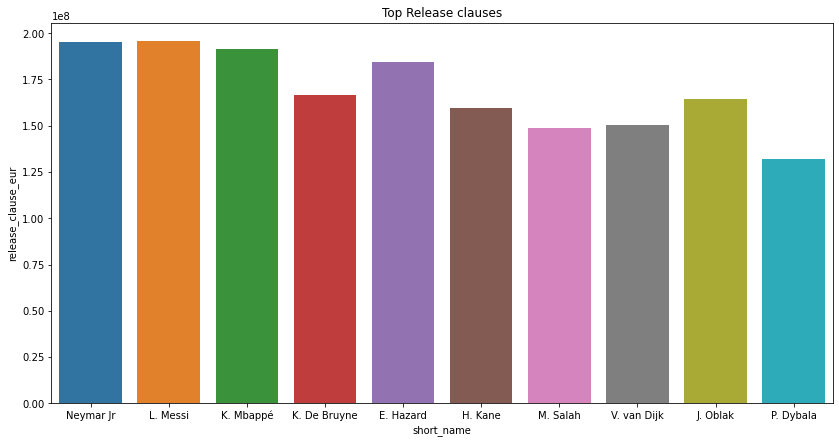

In [89]:
plt.figure(figsize=(14, 7))
sns.barplot(top_valued['short_name'].head(10), top_valued['release_clause_eur'].head(10)).set_title("Top Release clauses")

In [90]:
print("Min: ", dataset1['release_clause_eur'].min())
print("Mean: ", dataset1['release_clause_eur'].mean())
print("Max: ", dataset1['release_clause_eur'].max())

Min:  13000.0
Mean:  4740717.432273263
Max:  195800000.0


## WAGES

In [91]:
high_wage = data.sort_values(by=['wage_eur'], ascending=False)
high_wage.head(10)

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,PositionLB,PositionLM,PositionLW,PositionLWB,PositionRB,PositionRM,PositionRW,PositionRWB,PositionST,bmi
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,0,0,0,0,0,0,1,0,0,24.0
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,...,0,0,1,0,0,0,0,0,0,24.0
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,...,0,0,0,0,0,0,0,0,1,23.0
5,K. De Bruyne,28,181,70,Belgium,Manchester City,91,91,90000000,370000,...,0,0,0,0,0,0,0,0,0,21.0
22,A. Griezmann,28,176,73,France,FC Barcelona,89,89,69000000,370000,...,0,0,0,0,0,0,0,0,0,23.0
19,L. Suárez,32,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,...,0,0,0,0,0,0,0,0,1,25.0
8,L. Modrić,33,172,66,Croatia,Real Madrid,90,90,45000000,340000,...,0,0,0,0,0,0,0,0,0,22.0
36,T. Kroos,29,183,76,Germany,Real Madrid,88,88,57000000,330000,...,0,0,0,0,0,0,0,0,0,22.0
17,S. Agüero,31,173,70,Argentina,Manchester City,89,89,60000000,300000,...,0,0,0,0,0,0,0,0,1,23.0
21,Sergio Busquets,30,189,76,Spain,FC Barcelona,89,89,55000000,300000,...,0,0,0,0,0,0,0,0,0,21.0


Text(0.5, 1.0, 'Highest Wages')

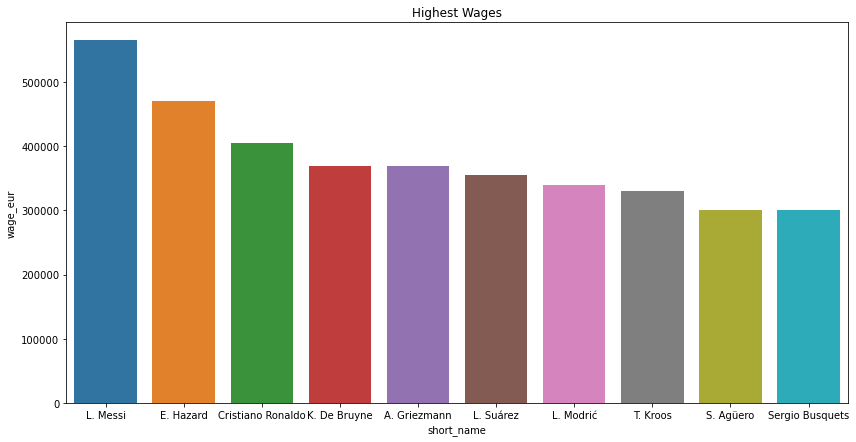

In [92]:
plt.figure(figsize=(14, 7))
sns.barplot(high_wage['short_name'].head(10), high_wage['wage_eur'].head(10)).set_title("Highest Wages")

In [93]:
print("Min: ", dataset1['release_clause_eur'].min())
print("Mean: ", dataset1['release_clause_eur'].mean())
print("Max: ", dataset1['release_clause_eur'].max())

Min:  13000.0
Mean:  4740717.432273263
Max:  195800000.0


Text(0.5, 1.0, 'Wage of top 10 players')

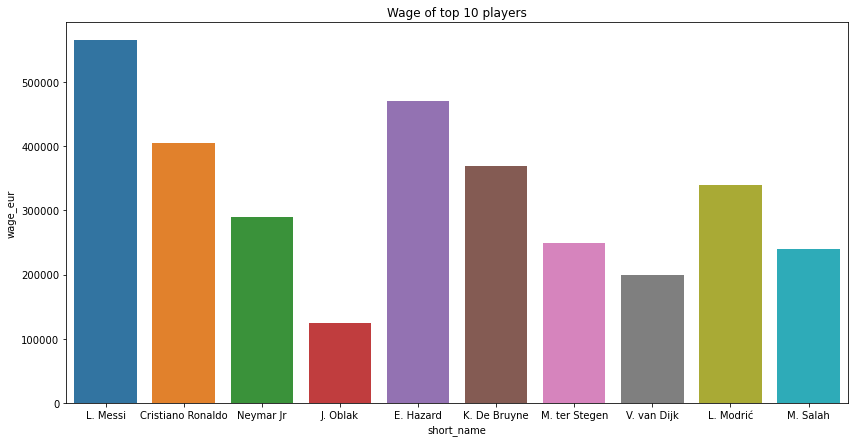

In [94]:
plt.figure(figsize=(14, 7))
sns.barplot(top_rated['short_name'].head(10), top_rated['wage_eur'].head(10)).set_title("Wage of top 10 players")

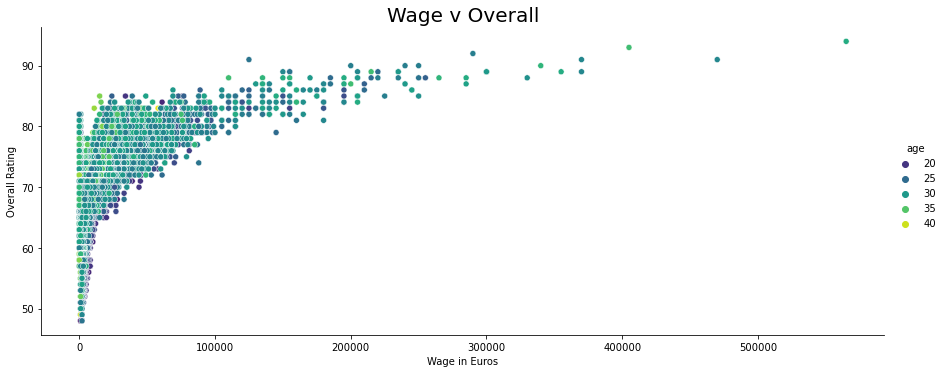

In [95]:
sns.relplot(x='wage_eur',y='overall',hue='age',palette = 'viridis', aspect=2.5,data=data)
plt.title('Wage v Overall',fontsize = 20)
plt.xlabel('Wage in Euros')
plt.ylabel('Overall Rating')
plt.show()

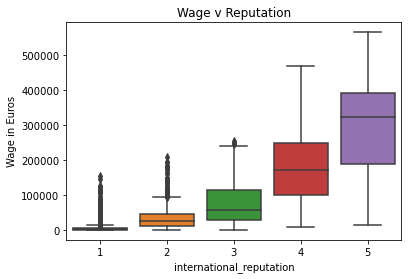

In [96]:
sns.boxplot(y='wage_eur',x='international_reputation',data=data)
plt.title('Wage v Reputation')
plt.ylabel('Wage in Euros')
plt.xlabel('international_reputation')
plt.show()

In [97]:
fig = px.scatter_3d(top_rated.head(20), x='potential', y='overall', z='wage_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Wage')
fig.show()

<AxesSubplot:>

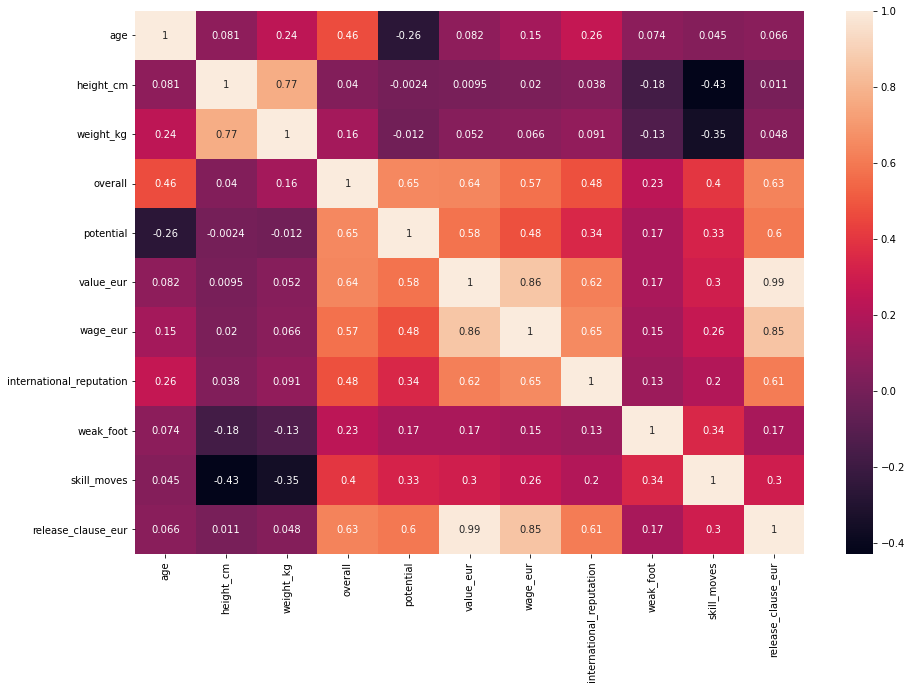

In [98]:
plt.figure(figsize=(15,10))
sns.heatmap(dataset1.corr(), annot=True, cbar=True)

# Task 2 Clustering of datasets based on Attributes.

In [99]:
data= pd.read_csv('players_20.csv')

In [100]:
#Clustering of the datasets

In [101]:
## clustering

In [102]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [103]:
data.shape

(18278, 104)

In [104]:
data.describe().columns #numeric veriable

Index(['sofifa_id', 'age', 'height_cm', 'weight_kg', 'overall', 'potential',
       'value_eur', 'wage_eur', 'international_reputation', 'weak_foot',
       'skill_moves', 'release_clause_eur', 'team_jersey_number',
       'contract_valid_until', 'nation_jersey_number', 'pace', 'shooting',
       'passing', 'dribbling', 'defending', 'physic', 'gk_diving',
       'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
       'gk_positioning', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positionin

In [105]:
data = data[['short_name', 'age', 'height_cm', 'weight_kg', 'overall', 'potential',
       'value_eur', 'wage_eur', 'international_reputation', 'weak_foot',
       'skill_moves', 'release_clause_eur', 'team_jersey_number',
       'contract_valid_until', 'nation_jersey_number', 'pace', 'shooting',
       'passing', 'dribbling', 'defending', 'physic', 'gk_diving',
       'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
       'gk_positioning', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']]

In [106]:
data = data[data.overall>86]
data

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,L. Messi,32,170,72,94,94,95500000,565000,5,4,...,75,96,33,37,26,6,11,15,14,8
1,Cristiano Ronaldo,34,187,83,93,93,58500000,405000,5,4,...,85,95,28,32,24,7,11,15,14,11
2,Neymar Jr,27,175,68,92,92,105500000,290000,5,5,...,90,94,27,26,29,9,9,15,15,11
3,J. Oblak,26,188,87,91,93,77500000,125000,3,3,...,11,68,27,12,18,87,92,78,90,89
4,E. Hazard,28,175,74,91,91,90000000,470000,4,4,...,88,91,34,27,22,11,12,6,8,8
5,K. De Bruyne,28,181,70,91,91,90000000,370000,4,5,...,79,91,68,58,51,15,13,5,10,13
6,M. ter Stegen,27,187,85,90,93,67500000,250000,3,4,...,25,70,25,13,10,88,85,88,88,90
7,V. van Dijk,27,193,92,90,91,78000000,200000,3,3,...,62,89,91,92,85,13,10,13,11,11
8,L. Modrić,33,172,66,90,90,45000000,340000,4,4,...,82,92,68,76,71,13,9,7,14,9
9,M. Salah,27,175,71,90,90,80500000,240000,3,3,...,77,91,38,43,41,14,14,9,11,14


In [107]:
pd.set_option('display.max_rows',70)
data.isnull().sum()

short_name                     0
age                            0
height_cm                      0
weight_kg                      0
overall                        0
potential                      0
value_eur                      0
wage_eur                       0
international_reputation       0
weak_foot                      0
skill_moves                    0
release_clause_eur             0
team_jersey_number             0
contract_valid_until           0
nation_jersey_number          21
pace                          10
shooting                      10
passing                       10
dribbling                     10
defending                     10
physic                        10
gk_diving                     45
gk_handling                   45
gk_kicking                    45
gk_reflexes                   45
gk_speed                      45
gk_positioning                45
attacking_crossing             0
attacking_finishing            0
attacking_heading_accuracy     0
attacking_

In [108]:
data = data.fillna(data.mean())
data

,short_name,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,L. Messi,32,170,72,94,94,95500000,565000,5,4,...,75,96,33,37,26,6,11,15,14,8
1,Cristiano Ronaldo,34,187,83,93,93,58500000,405000,5,4,...,85,95,28,32,24,7,11,15,14,11
2,Neymar Jr,27,175,68,92,92,105500000,290000,5,5,...,90,94,27,26,29,9,9,15,15,11
3,J. Oblak,26,188,87,91,93,77500000,125000,3,3,...,11,68,27,12,18,87,92,78,90,89
4,E. Hazard,28,175,74,91,91,90000000,470000,4,4,...,88,91,34,27,22,11,12,6,8,8
5,K. De Bruyne,28,181,70,91,91,90000000,370000,4,5,...,79,91,68,58,51,15,13,5,10,13
6,M. ter Stegen,27,187,85,90,93,67500000,250000,3,4,...,25,70,25,13,10,88,85,88,88,90
7,V. van Dijk,27,193,92,90,91,78000000,200000,3,3,...,62,89,91,92,85,13,10,13,11,11
8,L. Modrić,33,172,66,90,90,45000000,340000,4,4,...,82,92,68,76,71,13,9,7,14,9
9,M. Salah,27,175,71,90,90,80500000,240000,3,3,...,77,91,38,43,41,14,14,9,11,14


In [109]:
names = data.short_name.to_list() #saving names for later

data = data.drop(['short_name'], axis=1) #drop the short_names column

In [110]:
from sklearn import preprocessing

x = data.values # numpy array
scaler = preprocessing.MinMaxScaler()
x_scaled = scaler.fit_transform(x)
x_norm = pd.DataFrame(x_scaled)


In [111]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2) # 20 PCA for the plot
reduce = pd.DataFrame(pca.fit_transform(x_norm))

In [112]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5)

#fit the input data
kmeans = kmeans.fit(reduce)

#get the cluster labels
labels = kmeans.predict(reduce)

#centroid values
centroid = kmeans.cluster_centers_

#cluster values
clusters = kmeans.labels_.tolist()

In [113]:
reduce['cluster'] = clusters
reduce['name'] = names
reduce.columns = ['x','y','cluster','name']
reduce.head()

,x,y,cluster,name
0,-1.482137,-1.287998,3,L. Messi
1,-1.180190,-0.894344,3,Cristiano Ronaldo
2,-1.335542,-1.460300,3,Neymar Jr
3,2.974839,-0.789651,1,J. Oblak
4,-1.207091,-1.249757,3,E. Hazard


In [114]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

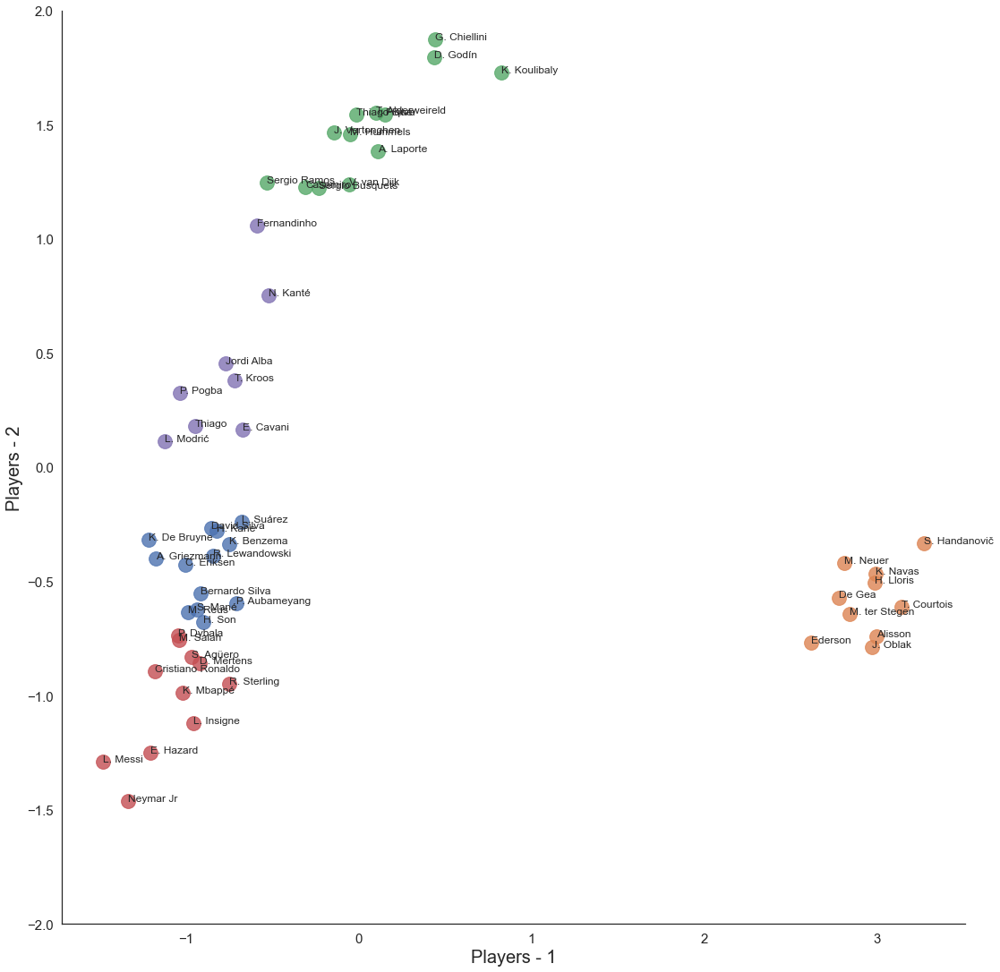

In [115]:
sns.set(style="white")

ax = sns.lmplot(x="x", y="y", hue='cluster', data = reduce, legend=False,
                   fit_reg=False, size = 15, scatter_kws={"s": 250})

texts = []
for x, y, s in zip(reduce.x, reduce.y, reduce.name):
    texts.append(plt.text(x, y, s))

ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel("Players - 1", fontsize = 20)
plt.ylabel("Players - 2", fontsize = 20)

plt.show()

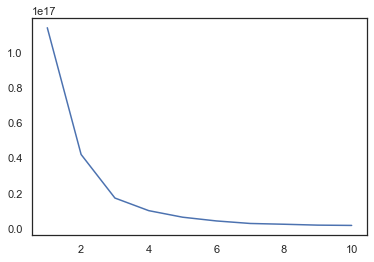

In [116]:
from sklearn.cluster import KMeans
wcss=[]
for i in range(1,11):
    kmeans=KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.show()

In [117]:
from sklearn.cluster import KMeans


# Initialise the model with K as 3
KMeans_model = KMeans(n_clusters=3, random_state=42)

#Training the model
KMeans_model.fit_predict(data)

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 2, 1, 2, 1, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 1])

In [118]:
KMeans_model.labels_

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 2, 1, 2, 1, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 1])

In [119]:
label=KMeans_model.labels_
label

from sklearn.metrics import silhouette_score
score=silhouette_score(data,label)
score

0.5582398004680009

# Hierarchial clustering

In [120]:
#Average linkage

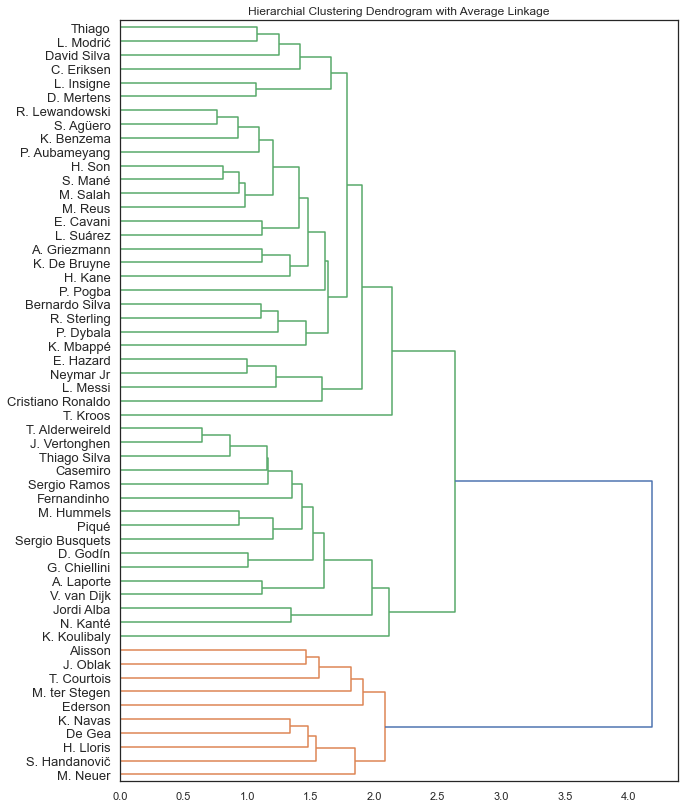

In [121]:
import scipy.cluster.hierarchy as sch
#plotting dendrogram using average linkage
plt.figure(figsize = (10,14))
plt.title('Hierarchial Clustering Dendrogram with Average Linkage')
dendrogram = sch.dendrogram(sch.linkage(x_norm,method = 'average'),labels= names,leaf_font_size = 13,orientation = 'right')

In [122]:
#Hierarchial clustering with single linkage

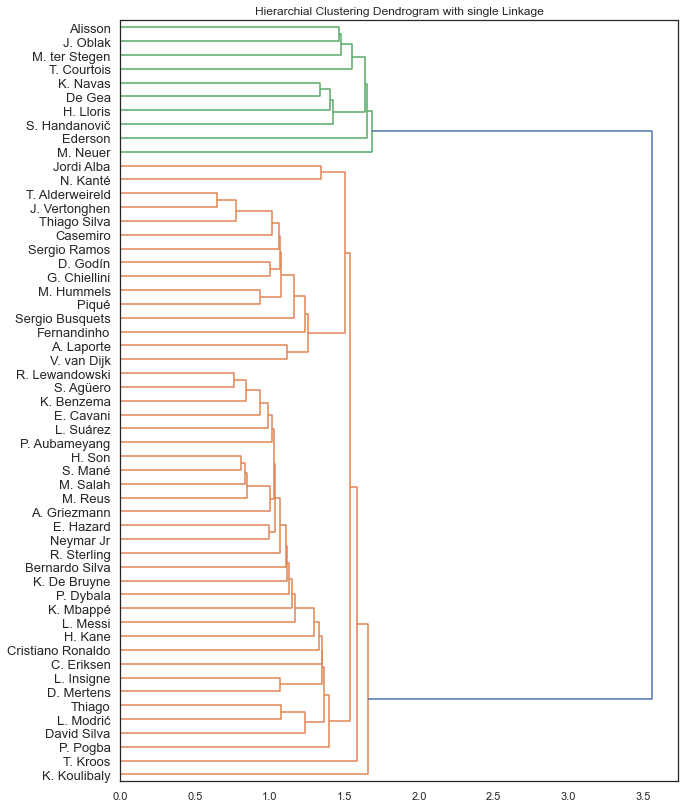

In [123]:
plt.figure(figsize = (10,14))
plt.title('Hierarchial Clustering Dendrogram with single Linkage')
dendrogram = sch.dendrogram(sch.linkage(x_norm,method = 'single'),labels = names,leaf_font_size = 13,orientation = 'right')

In [124]:
# Complete linkage clustering

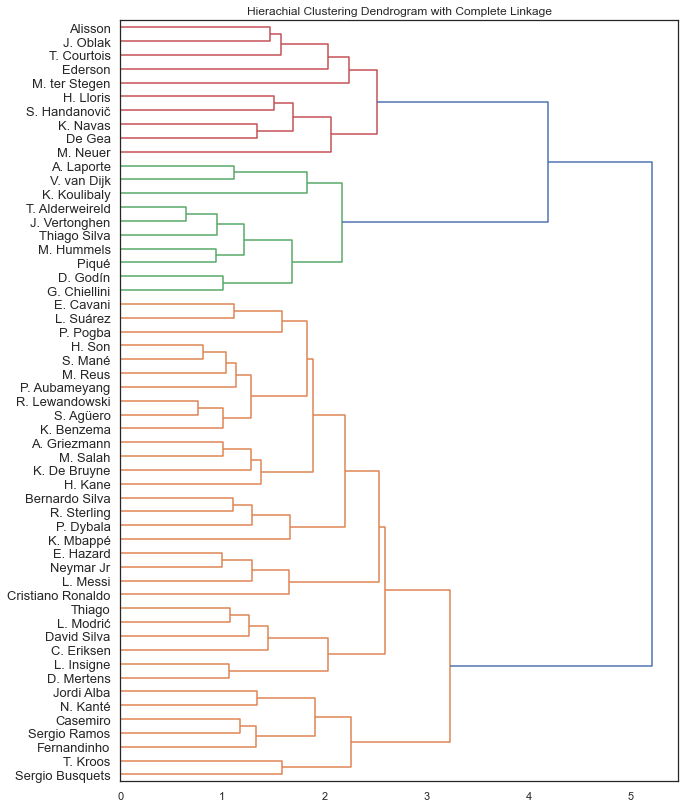

In [125]:
#Hierararchial clustering
plt.figure(figsize = (10,14))
plt.title('Hierachial Clustering Dendrogram with Complete Linkage')
dendrogram = sch.dendrogram(sch.linkage(x_norm,method = 'complete'),labels= names,leaf_font_size = 13,orientation = 'right')

# Task 3  

In [126]:
data= pd.read_csv('players_20.csv')

In [127]:
data['nationality'].value_counts()[0:10].index

Index(['England', 'Germany', 'Spain', 'France', 'Argentina', 'Brazil', 'Italy',
       'Colombia', 'Japan', 'Netherlands'],
      dtype='object')

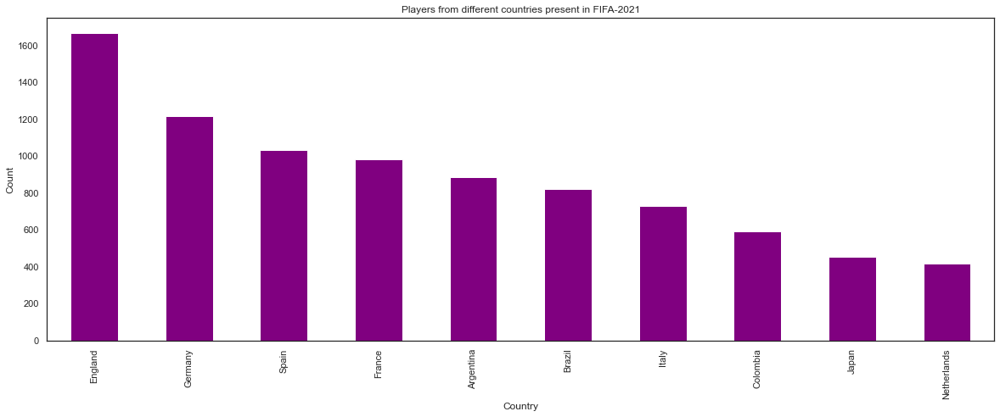

In [128]:
plt.figure(figsize = (20,7))
dataset1['nationality'].value_counts().head(10).plot.bar(color = 'purple')
plt.title('Players from different countries present in FIFA-2021')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

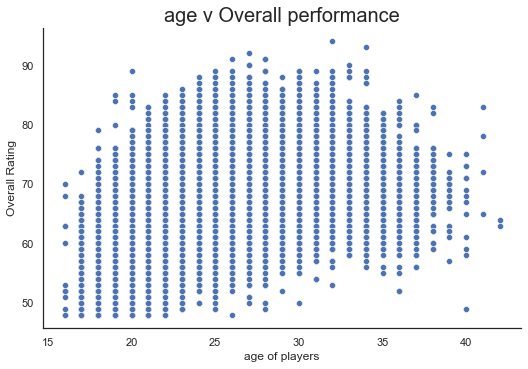

In [129]:
sns.relplot(x='age',y='overall',palette = 'viridis', aspect=1.5,data=data)
plt.title('age v Overall performance',fontsize = 20)
plt.xlabel('age of players')
plt.ylabel('Overall Rating')
plt.show()

In [130]:
fig = go.Figure()
fig = go.Figure(data = go.Scatter(
    x = dataset1['age'],
    y = dataset1['overall'],
    mode = 'markers',
 marker = dict(color = dataset1['overall'],showscale = True),
 text = dataset1['short_name'],))
fig.update_layout(title = 'Age vs overall Rating',
                 xaxis_title= 'Age',
                 yaxis_title = 'Overall_rating')
fig.show()
